In [47]:
import pandas as pd
import plotly.express as px
import seaborn as sns
import numpy as np

from plotly.subplots import make_subplots
import plotly.graph_objects as go

from src.config import DADOS_ORIGINAIS, DADOS_LIMPOS

In [48]:
df = pd.read_csv(DADOS_ORIGINAIS, compression='zip')

df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


In [49]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


In [50]:
df.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,-119.569704,35.631861,28.639486,2635.763081,537.870553,1425.476744,499.539680,3.870671,206855.816909
std,2.003532,2.135952,12.585558,2181.615252,421.385070,1132.462122,382.329753,1.899822,115395.615874
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1447.750000,296.000000,787.000000,280.000000,2.563400,119600.000000
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,1725.000000,605.000000,4.743250,264725.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


## Pairplot

In [51]:
# sns.pairplot(df, diag_kind='kde')

As observado no *describe*, as colunas `total_rooms`, `total_bedrooms`, `population`, `households` e também `median_income` apresentam baixa assimetria e com cauda longa à direita. Isso indica que a maior parte dos registros concentra valores baixos, enquanto há poucos valores significativamente elevados.

Diante desse padrão, é necessário aplicar as etapas de tratamento já estudadas — como tratamento de outliers, transformações de escala e possíveis transformações de distribuição — antes de encaminhar os dados para os modelos do scikit-learn.


Outra coisa bem interressante que o gráfico trouxe e falando da coluna target é uma linhas de valores nos extremos que pode significar arrendodamento o que precisa ser levado em conta na hora do modelo.

`Por isso é sempre importante ver o describe e perceber que há valores muito corretos`

## Analisando assimetria, valores duplicados, nulos e feature categóricas

In [52]:
## assimetria através do skew

df.select_dtypes("number").skew()

longitude            -0.297801
latitude              0.465953
housing_median_age    0.060331
total_rooms           4.147343
total_bedrooms        3.459546
population            4.935858
households            3.410438
median_income         1.646657
median_house_value    0.977763
dtype: float64

In [53]:
## analise da curtose

df.select_dtypes("number").kurtosis()

longitude             -1.330152
latitude              -1.117760
housing_median_age    -0.800629
total_rooms           32.630927
total_bedrooms        21.985575
population            73.553116
households            22.057988
median_income          4.952524
median_house_value     0.327870
dtype: float64

Podemos ver que os numeros e os gráficos acabam dizendo a mesma coisa a curtose muito alta onde a gente esperava assim como a assimetria.

In [54]:
# analisando para ver se tem coluna duplicadas

df[df.duplicated()]

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity


### Análise dos valores nulos

A gente viu no *df.info()* que há valores nulos na coluna ` total_bedrooms` que é o n° de quartos precisamos analisar para ver o que faremos com esses números

In [55]:
# visualizando as linhas com valores nulos 

df[df.isnull().any(axis=1)]

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
290,-122.16,37.77,47.0,1256.0,NaN,570.0,218.0,4.3750,161900.0,NEAR BAY
341,-122.17,37.75,38.0,992.0,NaN,732.0,259.0,1.6196,85100.0,NEAR BAY
538,-122.28,37.78,29.0,5154.0,NaN,3741.0,1273.0,2.5762,173400.0,NEAR BAY
563,-122.24,37.75,45.0,891.0,NaN,384.0,146.0,4.9489,247100.0,NEAR BAY
696,-122.10,37.69,41.0,746.0,NaN,387.0,161.0,3.9063,178400.0,NEAR BAY
...,...,...,...,...,...,...,...,...,...,...
20267,-119.19,34.20,18.0,3620.0,NaN,3171.0,779.0,3.3409,220500.0,NEAR OCEAN
20268,-119.18,34.19,19.0,2393.0,NaN,1938.0,762.0,1.6953,167400.0,NEAR OCEAN
20372,-118.88,34.17,15.0,4260.0,NaN,1701.0,669.0,5.1033,410700.0,<1H OCEAN
20460,-118.75,34.29,17.0,5512.0,NaN,2734.0,814.0,6.6073,258100.0,<1H OCEAN


Cada dataframe tem seu motivo para ter dados vazios. Cabe a gente cientista entender a base e buscar os motivos

In [56]:
df[df.isnull().any(axis=1)].describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,207.000000,207.000000,207.000000,207.000000,0.0,207.000000,207.000000,207.000000,207.000000
mean,-119.472560,35.497633,29.270531,2562.603865,NaN,1477.772947,510.024155,3.822244,206007.280193
std,2.001424,2.097298,11.964927,1787.269789,NaN,1057.448212,386.120704,1.955595,111638.214545
min,-124.130000,32.660000,4.000000,154.000000,NaN,37.000000,16.000000,0.852700,45800.000000
25%,-121.810000,33.970000,19.000000,1307.500000,NaN,781.000000,258.000000,2.564150,128750.000000
50%,-118.490000,34.200000,30.000000,2155.000000,NaN,1217.000000,427.000000,3.411500,175000.000000
75%,-117.985000,37.495000,38.000000,3465.000000,NaN,1889.500000,628.000000,4.615750,267700.000000
max,-114.590000,40.920000,52.000000,11709.000000,NaN,7604.000000,3589.000000,15.000100,500001.000000


Não parece ser nada programado e sim aleatório mesmo

### Colunas categóricas

A gente só tem a coluna `ocean_proximity` como string e pela descrição dela ela é categorica

In [57]:
df['ocean_proximity'].value_counts()

ocean_proximity
<1H OCEAN     9136
INLAND        6551
NEAR OCEAN    2658
NEAR BAY      2290
ISLAND           5
Name: count, dtype: int64

Mais uma questão que devemos nós prestar atenção na hora do treinamento de ML é esse valores ISLAND é bem provável que isso atrapalhe mais que ajude o modelo.

## BoxPlots

In [58]:
cols = df.select_dtypes(include="number").columns

for coluna in cols:
    fig=px.box(df,x=coluna, template='plotly_dark')
    fig.update_traces(quartilemethod="exclusive")
    # fig.show()

In [59]:
cols = df.select_dtypes(include="number").columns

fig = make_subplots(rows=3,cols=3)

for i,coluna in enumerate(cols):
    r = i//3+1
    c = i%3+1
    fig.add_trace(go.Box(x=df[coluna], name=coluna, quartilemethod="exclusive", showlegend=False), row=r, col=c)
    fig.update_xaxes(title_text=coluna, row=r, col=c)
    fig.update_yaxes(showticklabels=False, row=r, col=c)

fig.update_layout(template="plotly_dark", width=1300, height=900)
fig.show()


Realmente percebe-se os outlinears

## Correlações

In [60]:
corr = df.select_dtypes(include="number").corr()

fig = px.imshow(corr, text_auto=".2f", zmin=-1, zmax=1, template="plotly_dark", width=1500, height=1200, color_continuous_scale='RdBu_r')

fig.show()

Dois pontos bastante importantes que podemos notar nessa base...

- Correlação forte entre colunas => A gente tem um conjunto central de colunas que tem uma alta correlação lembrando que correlação alta significa que elas tendem a subir e descer juntas. Quando uma aumenta, a outra quase sempre aumenta também... Para modelos, isso pode significar redundância. Nesse caso faz total sentido pois tamanho e capacidade geralmente são diretamente proporcionais.

- Apenas uma coluna apresenta correlação forte com o target. A variável median_income é a que mais se correlaciona com o valor das casas (median_house_value). Isso indica que renda mediana da região é um dos principais fatores associados ao preço.


Isso tem que ser levado também em conta na hora de treinar o modelo...

## Novas Features

Você pode organizar e refinar essa análise assim:

Algumas variáveis derivadas fazem sentido com base na exploração dos dados:

* Classes de `median_income`
  Como é a variável mais correlacionada com o target, criar faixas de renda (baixa, média, alta, etc.) pode ajudar a capturar efeitos não lineares.
* Cômodos por domicílio (`total_rooms / households`)
  Essa razão mede o tamanho médio das moradias em cada área. É uma proxy de padrão habitacional: mais cômodos por domicílio geralmente indica imóveis maiores ou de maior padrão, o que tende a se associar a preços maiores. Por isso frequentemente aumenta a correlação com o target.

* Pessoas por domicílio (`population / households`)
  Captura densidade de ocupação. Valores altos podem indicar casas mais cheias ou regiões mais densas, o que pode se associar a imóveis menores ou de menor valor médio. É uma variável de contexto demográfico.

* Quartos por cômodos (`total_rooms / total_bedrooms`)

Vale lembrar que a base foi agregada por **blocos censitários**. Um bloco não é uma casa individual, mas uma pequena região geográfica. Assim:

* cada linha representa uma área, não um imóvel específico
* variáveis são médias ou totais da região
* o target é o valor mediano das casas naquele bloco

Implicação importante:
Os modelos aprendem padrões **regionais**, não individuais. Logo, features derivadas por domicílio fazem mais sentido do que totais absolutos, porque normalizam pelo tamanho do bloco.

Resumo prático:
Boas features aqui são razões e densidades. Elas descrevem melhor o perfil socioeconômico do bloco do que valores brutos. Isso costuma melhorar modelos preditivos nesse tipo de dado.


### Classe de media_income

In [61]:
df['median_income_cat'] = pd.cut(
    df['median_income'],
    bins=[0, 1.5, 3, 4.5, 6, np.inf], # esses valores definimos ele com base no info
    labels=[1, 2, 3, 4, 5] #aqui poderiamos colocar nome também
)

[0, 1.5)
[1.5, 3)
[3, 4.5)
[4.5, 6)
[6, +∞) é isso pq tem 5 labels e 6 intervalos

In [62]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   longitude           20640 non-null  float64 
 1   latitude            20640 non-null  float64 
 2   housing_median_age  20640 non-null  float64 
 3   total_rooms         20640 non-null  float64 
 4   total_bedrooms      20433 non-null  float64 
 5   population          20640 non-null  float64 
 6   households          20640 non-null  float64 
 7   median_income       20640 non-null  float64 
 8   median_house_value  20640 non-null  float64 
 9   ocean_proximity     20640 non-null  object  
 10  median_income_cat   20640 non-null  category
dtypes: category(1), float64(9), object(1)
memory usage: 1.6+ MB


In [63]:
df['median_income_cat'].value_counts().sort_index()

median_income_cat
1     822
2    6581
3    7236
4    3639
5    2362
Name: count, dtype: int64

<Axes: xlabel='median_income_cat'>

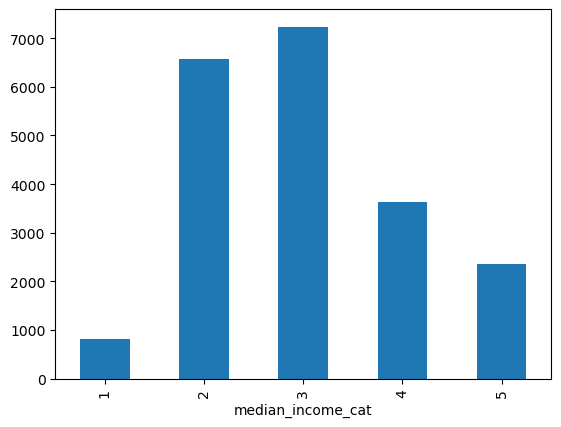

In [64]:
df['median_income_cat'].value_counts().sort_index().plot(kind="bar")

### Novas colunas citadas

In [65]:
df.columns

Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
       'median_house_value', 'ocean_proximity', 'median_income_cat'],
      dtype='object')

In [66]:
df['rooms_per_household'] = df['total_rooms'] / df['households']

df['population_per_household'] = df['population'] / df['households']

df['bedroomns_per_room'] = df['total_bedrooms'] / df['total_rooms']

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 14 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   longitude                 20640 non-null  float64 
 1   latitude                  20640 non-null  float64 
 2   housing_median_age        20640 non-null  float64 
 3   total_rooms               20640 non-null  float64 
 4   total_bedrooms            20433 non-null  float64 
 5   population                20640 non-null  float64 
 6   households                20640 non-null  float64 
 7   median_income             20640 non-null  float64 
 8   median_house_value        20640 non-null  float64 
 9   ocean_proximity           20640 non-null  object  
 10  median_income_cat         20640 non-null  category
 11  rooms_per_household       20640 non-null  float64 
 12  population_per_household  20640 non-null  float64 
 13  bedroomns_per_room        20433 non-null  floa

## Novo heatmap com base nas novas colunas

In [67]:
df.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,rooms_per_household,population_per_household,bedroomns_per_room
count,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000
mean,-119.569704,35.631861,28.639486,2635.763081,537.870553,1425.476744,499.539680,3.870671,206855.816909,5.429000,3.070655,0.213039
std,2.003532,2.135952,12.585558,2181.615252,421.385070,1132.462122,382.329753,1.899822,115395.615874,2.474173,10.386050,0.057983
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000,0.846154,0.692308,0.100000
25%,-121.800000,33.930000,18.000000,1447.750000,296.000000,787.000000,280.000000,2.563400,119600.000000,4.440716,2.429741,0.175427
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000,5.229129,2.818116,0.203162
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,1725.000000,605.000000,4.743250,264725.000000,6.052381,3.282261,0.239821
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000,141.909091,1243.333333,1.000000


In [68]:
corr = df.select_dtypes(include="number").corr()

fig = px.imshow(corr, text_auto=".2f", zmin=-1, zmax=1, template="plotly_dark", width=1500, height=1200, color_continuous_scale='RdBu_r')

fig.show()

A gente pode ver que temos 3 novas correlações

In [69]:
corr = df[['rooms_per_household','population_per_household','bedroomns_per_room','median_house_value']].corr()
corr_target = corr['median_house_value'].drop('median_house_value')
corr_target

rooms_per_household         0.151948
population_per_household   -0.023737
bedroomns_per_room         -0.255880
Name: median_house_value, dtype: float64

A correlação ainda é pequeina mas já deu uma melhorada no que a gente tinha, temos ao menos uma correlação `bedroomns_per_room` que puxa para baixo já melhorou

## Tratamento de outliers

In [70]:
df.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,rooms_per_household,population_per_household,bedroomns_per_room
count,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000
mean,-119.569704,35.631861,28.639486,2635.763081,537.870553,1425.476744,499.539680,3.870671,206855.816909,5.429000,3.070655,0.213039
std,2.003532,2.135952,12.585558,2181.615252,421.385070,1132.462122,382.329753,1.899822,115395.615874,2.474173,10.386050,0.057983
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000,0.846154,0.692308,0.100000
25%,-121.800000,33.930000,18.000000,1447.750000,296.000000,787.000000,280.000000,2.563400,119600.000000,4.440716,2.429741,0.175427
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000,5.229129,2.818116,0.203162
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,1725.000000,605.000000,4.743250,264725.000000,6.052381,3.282261,0.239821
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000,141.909091,1243.333333,1.000000


Vamos falar mais um pouco sobre os números sobre os máximos a gente já percebeu que temos alguns corte na base mas quantos?

In [71]:
df [
    df['median_house_value'] == df['median_house_value'].max()
]

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,median_income_cat,rooms_per_household,population_per_household,bedroomns_per_room
89,-122.27,37.80,52.0,249.0,78.0,396.0,85.0,1.2434,500001.0,NEAR BAY,1,2.929412,4.658824,0.313253
459,-122.25,37.87,52.0,609.0,236.0,1349.0,250.0,1.1696,500001.0,NEAR BAY,1,2.436000,5.396000,0.387521
493,-122.24,37.86,52.0,1668.0,225.0,517.0,214.0,7.8521,500001.0,NEAR BAY,5,7.794393,2.415888,0.134892
494,-122.24,37.85,52.0,3726.0,474.0,1366.0,496.0,9.3959,500001.0,NEAR BAY,5,7.512097,2.754032,0.127214
509,-122.23,37.83,52.0,2990.0,379.0,947.0,361.0,7.8772,500001.0,NEAR BAY,5,8.282548,2.623269,0.126756
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20422,-118.90,34.14,35.0,1503.0,263.0,576.0,216.0,5.1457,500001.0,<1H OCEAN,4,6.958333,2.666667,0.174983
20426,-118.69,34.18,11.0,1177.0,138.0,415.0,119.0,10.0472,500001.0,<1H OCEAN,5,9.890756,3.487395,0.117247
20427,-118.80,34.19,4.0,15572.0,2222.0,5495.0,2152.0,8.6499,500001.0,<1H OCEAN,5,7.236059,2.553439,0.142692
20436,-118.69,34.21,10.0,3663.0,409.0,1179.0,371.0,12.5420,500001.0,<1H OCEAN,5,9.873315,3.177898,0.111657


Ou seja podemos ver que 965 linhas do dataframe tem o target como valor maximo ou seja muitos registro diferentes pois a gente já verificou que não tem linhas duplicadas tem o target igual....

O que podemos fazer nesse caso é separar por Quantis por exemplo

In [72]:
df['median_house_value'].quantile(0.95)

489809.9999999999

Esse valor já começa a eliminar os registro que por algum motivo são artificiais

Então vamos fazer isso para todas as colunas pois no gráfico de pairplot várias colunas tem um acúmulo de valores nos seus respectivos máximos


Vamos tentar pegar o QUANTIL 0.99 dessas colunas

In [73]:
df_clean = df.copy()

In [74]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 14 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   longitude                 20640 non-null  float64 
 1   latitude                  20640 non-null  float64 
 2   housing_median_age        20640 non-null  float64 
 3   total_rooms               20640 non-null  float64 
 4   total_bedrooms            20433 non-null  float64 
 5   population                20640 non-null  float64 
 6   households                20640 non-null  float64 
 7   median_income             20640 non-null  float64 
 8   median_house_value        20640 non-null  float64 
 9   ocean_proximity           20640 non-null  object  
 10  median_income_cat         20640 non-null  category
 11  rooms_per_household       20640 non-null  float64 
 12  population_per_household  20640 non-null  float64 
 13  bedroomns_per_room        20433 non-null  floa

In [75]:
QUANTIL = 0.99

In [76]:
colunas_possiveis_arredondadas = ["housing_median_age", "total_rooms", "total_bedrooms", "population", 'households', "median_income", "median_house_value",
                                  "rooms_per_household", "population_per_household", "bedroomns_per_room"]

In [77]:
limites = df[colunas_possiveis_arredondadas].quantile(QUANTIL)
mask = (df[colunas_possiveis_arredondadas] < limites).all(axis=1)

df_clean = df[mask]

In [78]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Index: 17566 entries, 0 to 20639
Data columns (total 14 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   longitude                 17566 non-null  float64 
 1   latitude                  17566 non-null  float64 
 2   housing_median_age        17566 non-null  float64 
 3   total_rooms               17566 non-null  float64 
 4   total_bedrooms            17566 non-null  float64 
 5   population                17566 non-null  float64 
 6   households                17566 non-null  float64 
 7   median_income             17566 non-null  float64 
 8   median_house_value        17566 non-null  float64 
 9   ocean_proximity           17566 non-null  object  
 10  median_income_cat         17566 non-null  category
 11  rooms_per_household       17566 non-null  float64 
 12  population_per_household  17566 non-null  float64 
 13  bedroomns_per_room        17566 non-null  float64 


## Nova análise dos valores

In [79]:
df_clean.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,rooms_per_household,population_per_household,bedroomns_per_room
count,17566.000000,17566.000000,17566.000000,17566.000000,17566.000000,17566.000000,17566.000000,17566.000000,17566.000000,17566.000000,17566.000000,17566.000000
mean,-119.509858,35.601950,27.276955,2510.361152,515.361209,1386.223557,483.953034,3.696453,189591.204486,5.253849,2.934597,0.211654
std,1.984173,2.147246,11.323320,1593.957111,320.838680,844.886263,295.554440,1.541904,95988.907554,1.134053,0.691400,0.048323
min,-124.300000,32.540000,1.000000,6.000000,2.000000,3.000000,2.000000,0.499900,14999.000000,1.714286,0.750000,0.113535
25%,-121.600000,33.920000,18.000000,1464.250000,300.000000,816.000000,287.000000,2.547325,114300.000000,4.446441,2.470168,0.176919
50%,-118.460000,34.240000,28.000000,2131.000000,438.000000,1196.000000,415.000000,3.479200,171400.000000,5.205218,2.852579,0.203474
75%,-117.980000,37.670000,36.000000,3124.000000,643.000000,1738.000000,605.000000,4.622150,243800.000000,5.960973,3.306344,0.239171
max,-114.550000,41.950000,51.000000,11026.000000,2205.000000,5804.000000,1979.000000,10.594100,500000.000000,10.352941,5.392954,0.406295


In [80]:
# sns.pairplot(df_clean, diag_kind='kde')

In [81]:
len(df_clean.select_dtypes(include="number").columns)

12

In [82]:
cols = df_clean.select_dtypes(include="number").columns

fig = make_subplots(rows=4,cols=3)

for i,coluna in enumerate(cols):
    r = i//3+1
    c = i%3+1
    fig.add_trace(go.Box(x=df_clean[coluna], name=coluna, quartilemethod="exclusive", showlegend=False), row=r, col=c)
    fig.update_xaxes(title_text=coluna, row=r, col=c)
    fig.update_yaxes(showticklabels=False, row=r, col=c)

fig.update_layout(template="plotly_dark", width=1300, height=900)
fig.show()

In [83]:
corr = df_clean.select_dtypes(include="number").corr()

fig = px.imshow(corr, text_auto=".2f", zmin=-1, zmax=1, template="plotly_dark", width=1500, height=1200, color_continuous_scale='RdBu_r')

fig.show()

In [84]:
corr = df_clean[['rooms_per_household','population_per_household','bedroomns_per_room','median_house_value']].corr()
corr_target = corr['median_house_value'].drop('median_house_value')
corr_target

rooms_per_household         0.271911
population_per_household   -0.251717
bedroomns_per_room         -0.265921
Name: median_house_value, dtype: float64

Resumindo a gente agora consegue ver que a correlação entre as colunas e o target está bem maior e a gente perdeu um pouco o problema com outliers 

Agora é ver tudo isso no modelo.

## Otimização final

In [85]:
df_clean['ocean_proximity'].value_counts()

ocean_proximity
<1H OCEAN     7889
INLAND        5935
NEAR OCEAN    2224
NEAR BAY      1516
ISLAND           2
Name: count, dtype: int64

In [86]:
# a gente precisa excluir esses registro pois é bem provável que o nosso modelo não aprenda nada

df_clean = df_clean.loc[df_clean['ocean_proximity'] != 'ISLAND']
df_clean['ocean_proximity'].value_counts()

ocean_proximity
<1H OCEAN     7889
INLAND        5935
NEAR OCEAN    2224
NEAR BAY      1516
Name: count, dtype: int64

In [87]:
df_clean['ocean_proximity'] = df_clean['ocean_proximity'].astype("category")

df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Index: 17564 entries, 0 to 20639
Data columns (total 14 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   longitude                 17564 non-null  float64 
 1   latitude                  17564 non-null  float64 
 2   housing_median_age        17564 non-null  float64 
 3   total_rooms               17564 non-null  float64 
 4   total_bedrooms            17564 non-null  float64 
 5   population                17564 non-null  float64 
 6   households                17564 non-null  float64 
 7   median_income             17564 non-null  float64 
 8   median_house_value        17564 non-null  float64 
 9   ocean_proximity           17564 non-null  category
 10  median_income_cat         17564 non-null  category
 11  rooms_per_household       17564 non-null  float64 
 12  population_per_household  17564 non-null  float64 
 13  bedroomns_per_room        17564 non-null  float64 


In [88]:
colunas_valores_inteiros = []

for coluna in df_clean.select_dtypes("number").columns:
    if df_clean[coluna].apply(float.is_integer).all():
        colunas_valores_inteiros.append(coluna)

colunas_valores_inteiros

['housing_median_age',
 'total_rooms',
 'total_bedrooms',
 'population',
 'households',
 'median_house_value']

In [89]:
colunas_valores_float = df_clean.select_dtypes("number").columns.difference(colunas_valores_inteiros)

colunas_valores_float

Index(['bedroomns_per_room', 'latitude', 'longitude', 'median_income',
       'population_per_household', 'rooms_per_household'],
      dtype='object')

In [90]:
df_clean[colunas_valores_inteiros] = df_clean[colunas_valores_inteiros].apply(
    pd.to_numeric, downcast="integer"
)

df_clean[colunas_valores_float] = df_clean[colunas_valores_float].apply(
    pd.to_numeric, downcast="float"
)

df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Index: 17564 entries, 0 to 20639
Data columns (total 14 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   longitude                 17564 non-null  float32 
 1   latitude                  17564 non-null  float32 
 2   housing_median_age        17564 non-null  int8    
 3   total_rooms               17564 non-null  int16   
 4   total_bedrooms            17564 non-null  int16   
 5   population                17564 non-null  int16   
 6   households                17564 non-null  int16   
 7   median_income             17564 non-null  float32 
 8   median_house_value        17564 non-null  int32   
 9   ocean_proximity           17564 non-null  category
 10  median_income_cat         17564 non-null  category
 11  rooms_per_household       17564 non-null  float32 
 12  population_per_household  17564 non-null  float32 
 13  bedroomns_per_room        17564 non-null  float32 


In [ ]:
df_clean.describe()


,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,rooms_per_household,population_per_household,bedroomns_per_room
count,17564.000000,17564.000000,17564.000000,17564.000000,17564.000000,17564.000000,17564.000000,17564.000000,17564.000000,17564.000000,17564.000000,17564.000000
mean,-119.509995,35.602200,27.276873,2510.510875,515.378046,1386.315019,483.979447,3.696602,189570.803803,5.253923,2.934664,0.211643
std,1.984252,2.147250,11.323957,1593.977891,320.848886,844.889138,295.559700,1.541925,95971.413796,1.134085,0.691408,0.048315
min,-124.300003,32.540001,1.000000,6.000000,2.000000,3.000000,2.000000,0.499900,14999.000000,1.714286,0.750000,0.113535
25%,-121.599998,33.919998,18.000000,1464.750000,300.000000,816.000000,287.000000,2.547375,114300.000000,4.446466,2.470259,0.176919
50%,-118.459999,34.240002,28.000000,2131.000000,438.000000,1196.000000,415.000000,3.479200,171400.000000,5.205450,2.852657,0.203465
75%,-117.980003,37.669998,36.000000,3124.000000,643.000000,1738.000000,605.000000,4.622525,243800.000000,5.961016,3.306427,0.239151
max,-114.550003,41.950001,51.000000,11026.000000,2205.000000,5804.000000,1979.000000,10.594100,500000.000000,10.352942,5.392954,0.406295


In [ ]:
df_clean.to_parquet(DADOS_LIMPOS, index=False)